<a href="https://colab.research.google.com/github/stmulugheta/AI-Projects-2021/blob/main/face_visualization_trial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [28]:
from google.colab import drive

drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [29]:
!ls ('/contnent/drive/Mydrive')

shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
/bin/bash: -c: line 0: syntax error near unexpected token `'/contnent/drive/Mydrive''
/bin/bash: -c: line 0: `ls ('/contnent/drive/Mydrive')'


In [30]:
import os

# CHANGE THIS BELOW PATHS TO YOUR OWN DRIVE PATH CONTAINED YOUR FOLDER DATASET
path = '/content/gdrive/MyDrive/Data'
os.chdir(path)

# Configuration

In [31]:
import random, re, math
import tensorflow as tf
print('Tensorflow version ' + tf.__version__)

Tensorflow version 2.7.0


# Metadata construction

In [32]:
folder_dataset = './'

dataset_dict = {
    'race_id': {
        0: 'Sounthest and East Asian', 
        1: 'Indian', 
        2: 'Black', 
        3: 'White', 
        4: 'Middle Eastern',
        5: 'Latino_Hispanic'
    }
}

dataset_dict['race_alias'] = dict((g, i) for i, g in dataset_dict['race_id'].items())
race_dict = dataset_dict['race_alias']
race_id = dataset_dict['race_id']
race_dict

{'Black': 2,
 'Indian': 1,
 'Latino_Hispanic': 5,
 'Middle Eastern': 4,
 'Sounthest and East Asian': 0,
 'White': 3}

In [33]:
import numpy as np 
import pandas as pd
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# Importing the required libraries for XML
import xml.etree.ElementTree as Xet

IM_WIDTH = IM_HEIGHT = 224
SEED = 777

def seed_everything(seed=SEED):
  os.environ['PYTHONHASHSEED'] = str(seed)
  np.random.seed(seed)
  random.seed(seed)
  tf.random.set_seed(seed)

def get_id(file_path):
  return file_path.split('/')[1].split('.')[0]

In [34]:
# folder metadata of each csv file
csv_1 = pd.read_csv("./unlabeled_1_false.csv")
csv_2 = pd.read_csv("./unlabeled_2_false.csv")
csv_3 = pd.read_csv("./unlabeled_3_false.csv")
csv_4 = pd.read_csv("./unlabeled_4_false.csv")
csv_5 = pd.read_csv("./unlabeled_5_false.csv")
csv_6 = pd.read_csv("./unlabeled_6_false.csv")
csv_7 = pd.read_csv("./unlabeled_7_false.csv")
csv_8 = pd.read_csv("./unlabeled_8_false.csv")
csv_9 = pd.read_csv("./unlabeled_9_false.csv")
csv_1 = pd.read_csv("./unlabeled_10_false.csv")

## Util functions

In [35]:
def xml_to_csv(xml_path):
  cols = ['id', 'ethnicity']
  rows = list()

  # Parsing the XML file
  xmlparse = Xet.parse(xml_path)
  root = xmlparse.getroot()
  for i in root:
    id = i.find("id").text
    race = i.find("ethnicity").text
  
    rows.append({"id": id,
                 "ethnicity": race})
  
  df = pd.DataFrame(rows, columns=cols)
  return df

vgg2_train_df = xml_to_csv("./vgg2_meta/finalTrain.xml")

In [36]:
vgg2_train_df

,id,ethnicity
0,n000002,3
1,n000003,3
2,n000004,3
3,n000005,3
4,n000006,4
...,...,...
8625,n009275,2
8626,n009276,2
8627,n009277,2
8628,n009278,2


# Dataset

In [37]:
from sklearn.utils import shuffle
from torch.utils.data import DataLoader, Dataset
from tensorflow.keras.utils import Sequence
import random

IM_WIDTH = IM_HEIGHT = 224

class Dataset(Sequence):
  def __init__(self, dataframe, vgg2_df, identity_df, image_dir, batch_size):
    super().__init__()

    # Metadata csv files
    self.df = dataframe  # Annotation & Image's ID dataframe
    self.identity_df = identity_df
    self.vgg2_df = vgg2_df

    self.files = dataframe['file']  # Image's ID
    self.class_labels = [None] * len(self.files)  # Image's label
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.indexes = np.arange(len(self.df))
    self.dim = (IM_WIDTH, IM_HEIGHT, 3)
    self.n_classes = 1

  def __len__(self):
    """Denotes the number of batch per epoch"""
    return int(np.floor(len(self.df) / self.batch_size))


  def __getitem__(self, index: int):
    # Generate indexes of a batch 
    indexes = self.indexes[index*self.batch_size : (index+1)*self.batch_size]

    # Find list of image's paths
    list_people = [self.df.iloc[idx] for idx in indexes]

    # Load image & label each batch
    X, y, highest_probs, filenames, vgg2_race, names = self.__data_generation(list_people)

    # VGG2 race 
    return X, y, highest_probs, filenames, vgg2_race, names


  def load_image(self, file_name):
    # loads 1 image from dataset, returns img, original hw, resized hw
    """Load 1 image from dataset
    Input:
      index: idx to search for image's id
    Output:
      img, hw_original, hw_resized """
    # Read an image using opencv2
    img = cv2.imread(f'{self.image_dir}/{file_name}', cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR to RGB
    assert img is not None, 'Image Not Found'

    img_resize = cv2.resize(img, (IM_WIDTH, IM_HEIGHT), interpolation=cv2.INTER_AREA)
    return np.array(img_resize).astype("int")


  def __data_generation(self, list_people):
    """Generate set of data with batch_size samples""" 
    # X: (n_samples, *dim, n_channels)
    # Initialization
    X = np.empty((self.batch_size, *self.dim))
    y = np.empty((self.batch_size, self.n_classes), dtype=object)
    filenames = np.empty((self.batch_size, self.n_classes), dtype=object)
    highest_probs = np.empty((self.batch_size, self.n_classes), dtype=np.float32)
    vgg2_race = np.empty((self.batch_size, 1), dtype=object)
    names = np.empty((self.batch_size, 1), dtype=object)

    # Generate data
    for i, person in enumerate(list_people):
      # Load & preprocess img
      X[i,] = self.load_image(person['file'])
      # Load target
      y[i,] = person['race']

      # Get race with highest prob
      race = person[['race']].iloc[0]
      highest_probs[i,] = person[race]

      # File names
      filenames[i,] = person['file'].split('.')[0]
      # VGG2 race
      per_id = person['file'].split('_')[0]
      try:
        vgg2_race[i,] = self.vgg2_df.loc[self.vgg2_df['id'] == per_id]['ethnicity'].values[0]
      except:
        vgg2_race[i,] = 'None'
      # Name of each person
      try:
        names[i,] = self.identity_df.loc[self.identity_df['Class_ID'] == per_id]['Name'].values[0]
      except:
        names[i,] = "None"

    return X, y, highest_probs, filenames, vgg2_race, names


In [38]:
def collate_fn(batch):
  return tuple(zip(*batch))

def visualize_face(df, vgg2_df, identity_df, face_dir, batch_size, indx):
  dataset = Dataset(df, vgg2_df, identity_df, face_dir, batch_size)  

  fig, ax = plt.subplots(7, 5, figsize=(25, 25))
  ax = ax.flatten()
  images, race_labels, highest_probs, filenames, vgg2_races, names = dataset[indx]

  for i in range(33):  # Go through each batch 
    sample = images[i]
    height, width = sample.shape[:2]
    race = race_labels[i][0][:3]
    prob = round(float(highest_probs[i][0]), 3)
    filename = filenames[i][0][:7]
    vgg2_race = vgg2_races[i][0]
    name = names[i][0]

    title = f"Pred: {race}({str(prob)}), {filename}, VGG2's: {vgg2_race}, {name}"
    ax[i].set_title(title, fontsize=10)
    ax[i].imshow(sample.astype("uint8"))  # Visualize a sample for each batch
  plt.show()

# Folder 1

In [39]:
# folder metadata
csv_file = pd.read_csv("./unlabeled_1_false.csv")
FACE_DIR = "./1"
vgg2_train_df = xml_to_csv("./vgg2_meta/finalTrain.xml")
identity_df = pd.read_csv("./vgg2_meta/identity_meta.csv")[["Class_ID", "Name"]]
BATCH_SIZE = 33

In [40]:
len(csv_file)

99

In [41]:
# Total number of index in "Dataset" object
dataset = Dataset(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE)
len(dataset)

3

In [42]:
csv_file

,file,race,White,Black,Southeast and East Asian,Indian,Latino_Hispanic,Middle Eastern
0,n002239_0002_01.jpg,White,0.684319,0.000014,0.043605,0.261098,0.010750,0.000214
1,n001373_0001_01.jpg,Black,0.169003,0.709003,0.000013,0.121768,0.000033,0.000181
2,n004122_0004_01.jpg,Southeast and East Asian,0.374183,0.001121,0.621448,0.000389,0.001640,0.001219
3,n002161_0002_01.jpg,Southeast and East Asian,0.317453,0.000004,0.681811,0.000108,0.000611,0.000013
4,n000475_0001_02.jpg,Southeast and East Asian,0.020145,0.299833,0.489769,0.000634,0.133786,0.055832
...,...,...,...,...,...,...,...,...
94,n003490_0004_01.jpg,Southeast and East Asian,0.130955,0.038251,0.799879,0.009342,0.013803,0.007771
95,n000161_0006_01.jpg,Indian,0.147522,0.136687,0.055702,0.658101,0.001423,0.000565
96,n008972_0006_02.jpg,Indian,0.305850,0.005653,0.001083,0.685387,0.000967,0.001060
97,n004974_0002_01.jpg,Southeast and East Asian,0.162614,0.000003,0.792735,0.010999,0.008062,0.025587


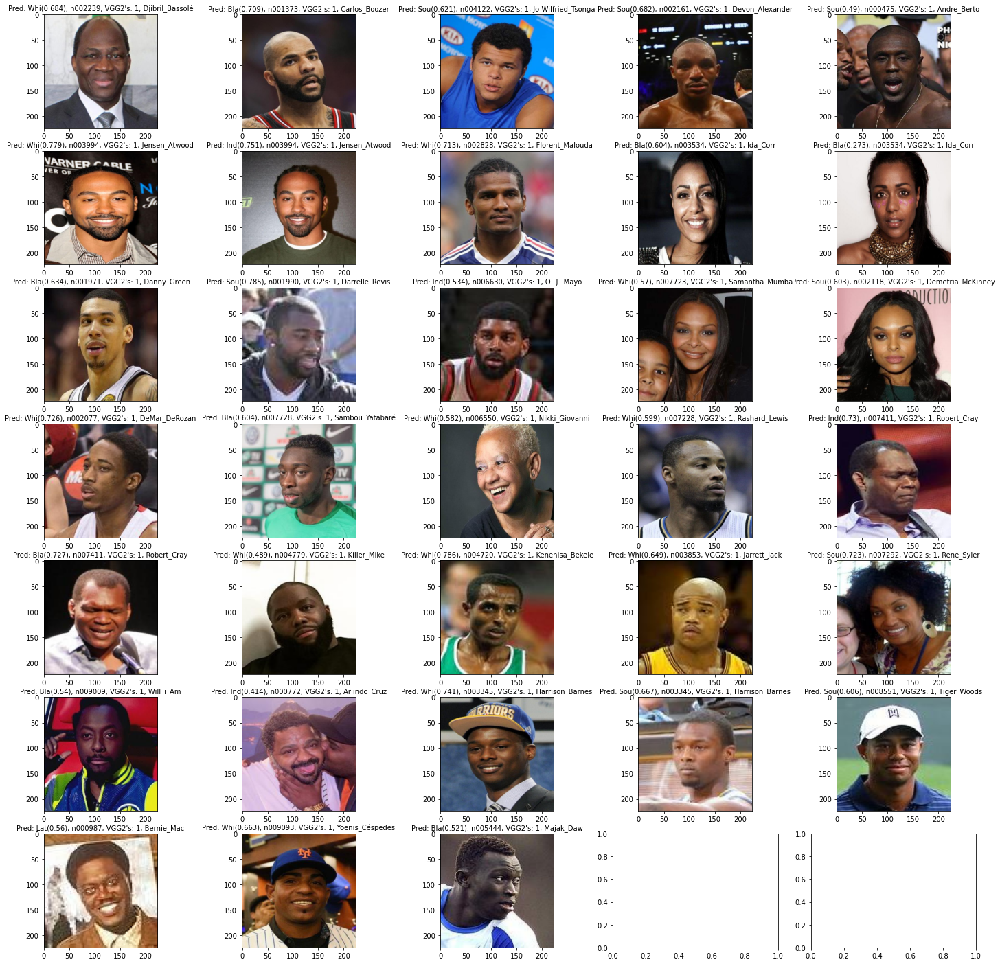

In [43]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 0)

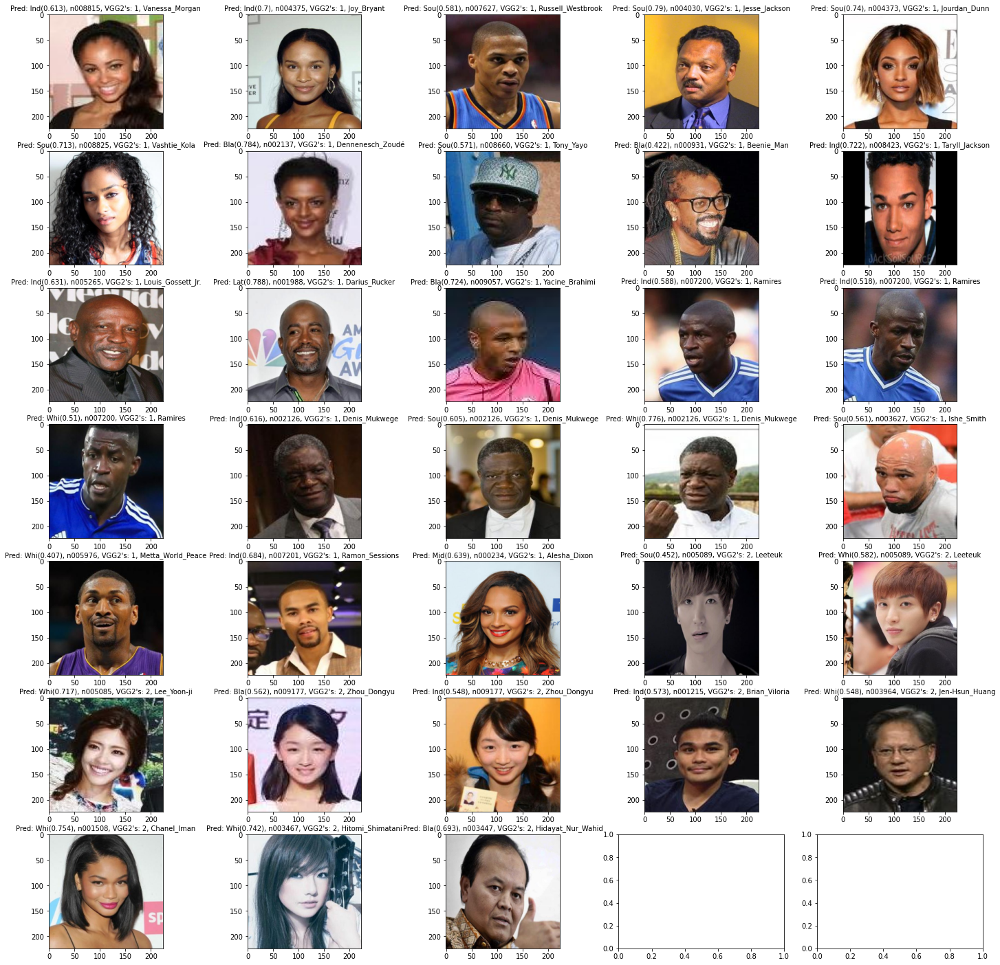

In [44]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 1)

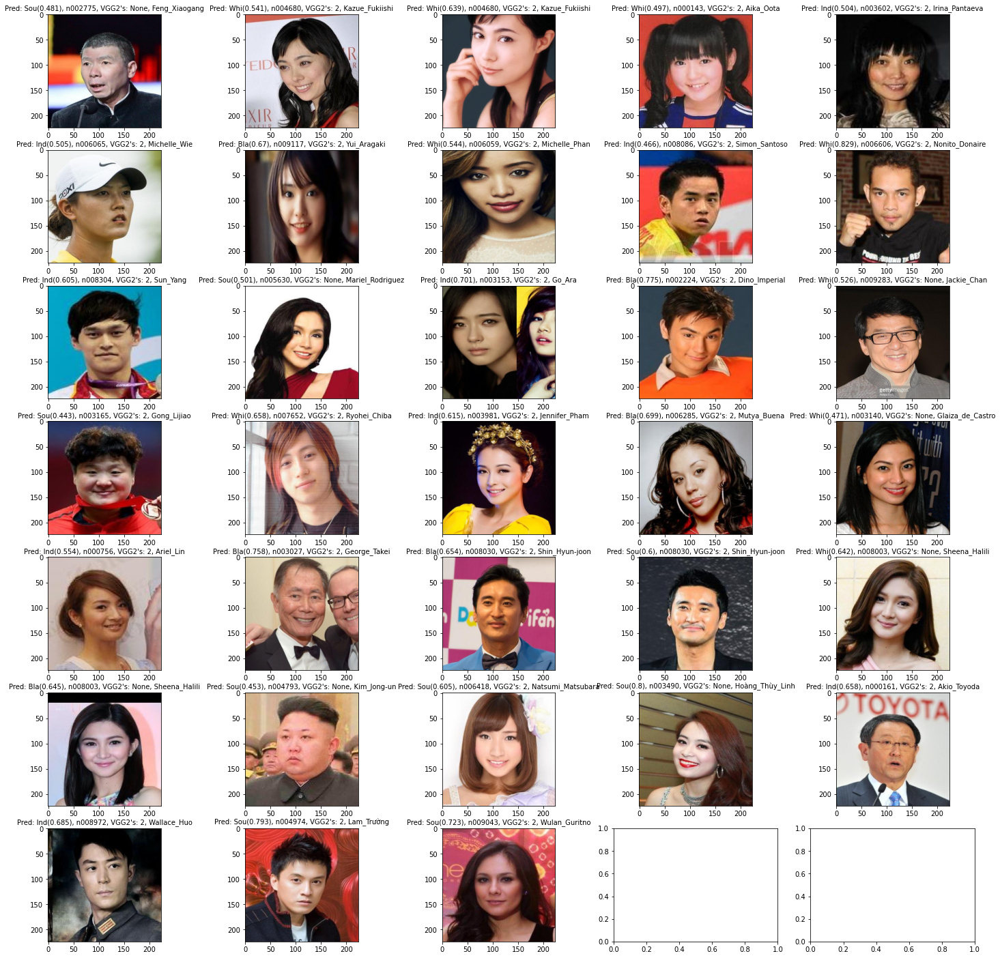

In [45]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 2)

# Folder 2

In [46]:
# folder metadata
csv_file = pd.read_csv("./unlabeled_2_false.csv")
FACE_DIR = "./2"
vgg2_train_df = xml_to_csv("./vgg2_meta/finalTrain.xml")
identity_df = pd.read_csv("./vgg2_meta/identity_meta.csv")[["Class_ID", "Name"]]
BATCH_SIZE = 33

In [47]:
len(csv_file)

99

In [48]:
# Total number of index in "Dataset" object
dataset = Dataset(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE)
len(dataset)

3

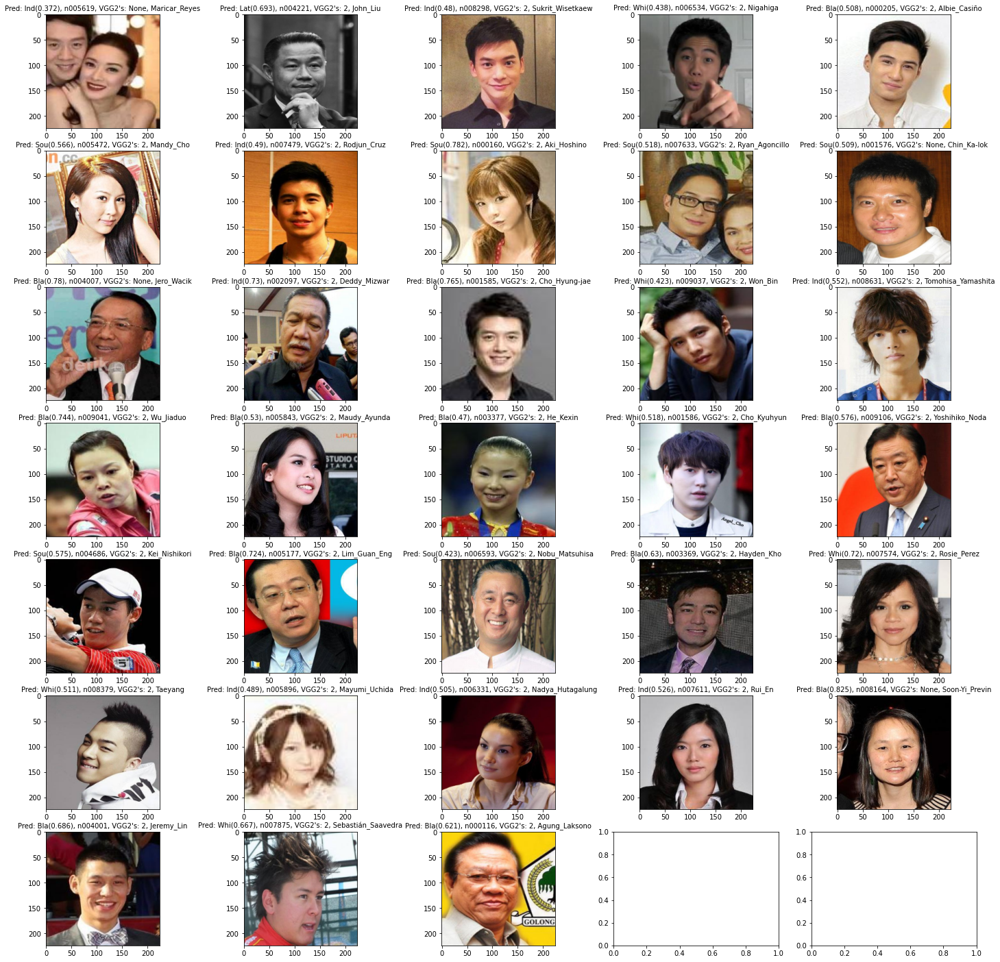

In [49]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 0)

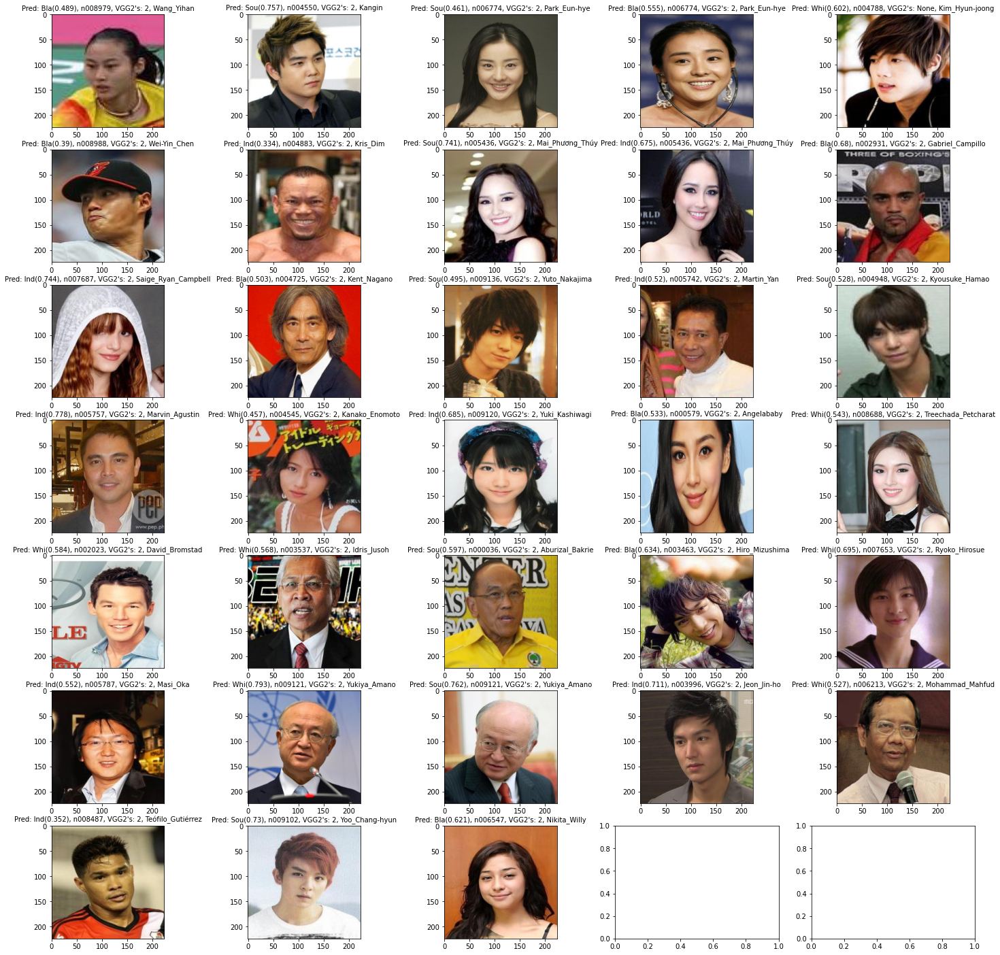

In [50]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 1)

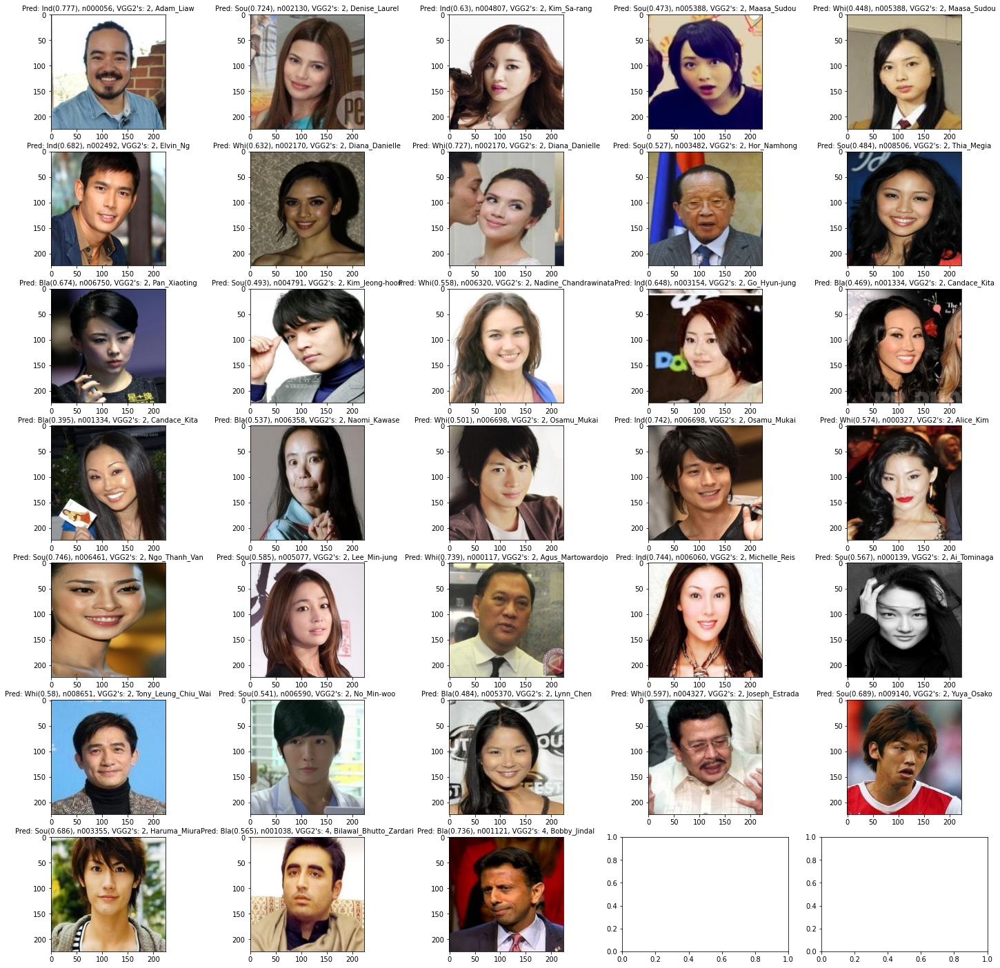

In [51]:
visualize_face(csv_file, vgg2_train_df, identity_df, FACE_DIR, BATCH_SIZE, 2)